In [1]:
import os
import numpy as np
import pandas as pd

from PIL import Image
import matplotlib.pyplot as plt

In [2]:
BASE_PATH='/grand/projects/BirdAudio/Soundscapes/Xeno_Canto_Spectrograms/'

#PATH='morton_dataset/Cardinalis cardinalis_Northern Cardinal/XC11713_3.png'
#PATH='morton_dataset/Cardinalis cardinalis_Northern Cardinal/XC297495_1.png'
#PATH='morton_dataset/Cardinalis cardinalis_Northern Cardinal/XC560427_2.png'
#PATH='morton_dataset/Cardinalis cardinalis_Northern Cardinal/XC618938_0.png'

#PATH='morton_dataset/Leiothlypis peregrina_Tennessee Warbler/XC377616_0.png'


PATH='woodpecker_dataset/Picoides tridactylus_Eurasian Three-toed Woodpecker/XC67324_1.png'

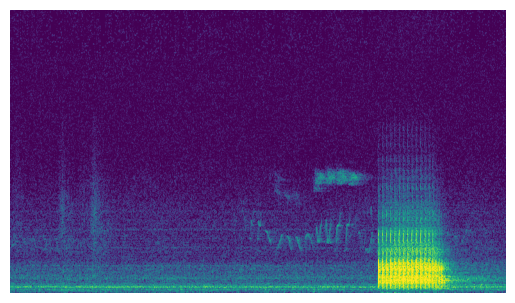

In [3]:
img = Image.open(os.path.join(BASE_PATH, PATH))
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

In [4]:
dpath='/grand/projects/BirdAudio/Soundscapes/TSNE_Data'

df = pd.read_csv (os.path.join(dpath, 'Data.csv'))

df

,Unnamed: 0,x,y,paths,labels,dataset,bird_class,bird_label,dataset_label
0,0,55.277367,-43.092117,Spectrogram_Images/morton_dataset/Vireo olivac...,0,morton_dataset,Vireo olivaceus_Red-eyed Vireo,54,0
1,1,21.170990,28.876804,Spectrogram_Images/woodpecker_dataset/Dryocopu...,1,woodpecker_dataset,Dryocopus martius_Black Woodpecker,14,1
2,2,-62.589428,79.106964,Spectrogram_Images/morton_dataset/Melospiza me...,34,morton_dataset,Melospiza melodia_Song Sparrow,25,0
3,3,-3.626113,-10.874754,Spectrogram_Images/morton_dataset/Vireo gilvus...,2,morton_dataset,Vireo gilvus_Warbling Vireo,53,0
4,4,73.904282,64.712952,Spectrogram_Images/woodpecker_dataset/Dryobate...,69,woodpecker_dataset,Dryobates minor_Lesser Spotted Woodpecker,12,1
...,...,...,...,...,...,...,...,...,...
8973,8973,-17.510485,-25.640804,Spectrogram_Images/morton_dataset/Cardinalis c...,2,morton_dataset,Cardinalis cardinalis_Northern Cardinal,2,0
8974,8974,84.489922,53.650597,Spectrogram_Images/morton_dataset/Cardinalis c...,44,morton_dataset,Cardinalis cardinalis_Northern Cardinal,2,0
8975,8975,-84.581940,11.320912,Spectrogram_Images/woodpecker_dataset/Dendroco...,47,woodpecker_dataset,Dendrocopos major_Great Spotted Woodpecker,9,1
8976,8976,-24.233438,-50.203979,Spectrogram_Images/morton_dataset/Melospiza me...,87,morton_dataset,Melospiza melodia_Song Sparrow,25,0


In [5]:
sample=df[df['paths']==os.path.join('Spectrogram_Images', PATH)]
list(sample['y'])[0]

-9.168766975402832

In [6]:
data=[]
v1 = np.array([list(sample['x'])[0], list(sample['y'])[0]])
for row in df.iterrows():
    v2 = np.array([row[1]['x'], row[1]['y']])
    dist = np.linalg.norm(v1 - v2)
    auxiliary={}
    auxiliary['x']=row[1]['x']
    auxiliary['y']=row[1]['y']
    auxiliary['labels']=row[1]['labels']
    auxiliary['paths']=row[1]['paths']
    auxiliary['dataset']=row[1]['dataset']
    auxiliary['bird_class']=row[1]['bird_class']
    auxiliary['bird_label']=row[1]['bird_label']
    auxiliary['dataset_label']=row[1]['dataset_label']
    auxiliary['dist']=dist
    data.append(auxiliary)
    
data = pd.DataFrame(data=data)
data

,x,y,labels,paths,dataset,bird_class,bird_label,dataset_label,dist
0,55.277367,-43.092117,0,Spectrogram_Images/morton_dataset/Vireo olivac...,morton_dataset,Vireo olivaceus_Red-eyed Vireo,54,0,33.947768
1,21.170990,28.876804,1,Spectrogram_Images/woodpecker_dataset/Dryocopu...,woodpecker_dataset,Dryocopus martius_Black Woodpecker,14,1,51.963267
2,-62.589428,79.106964,34,Spectrogram_Images/morton_dataset/Melospiza me...,morton_dataset,Melospiza melodia_Song Sparrow,25,0,148.291314
3,-3.626113,-10.874754,2,Spectrogram_Images/morton_dataset/Vireo gilvus...,morton_dataset,Vireo gilvus_Warbling Vireo,53,0,60.214997
4,73.904282,64.712952,69,Spectrogram_Images/woodpecker_dataset/Dryobate...,woodpecker_dataset,Dryobates minor_Lesser Spotted Woodpecker,12,1,75.889189
...,...,...,...,...,...,...,...,...,...
8973,-17.510485,-25.640804,2,Spectrogram_Images/morton_dataset/Cardinalis c...,morton_dataset,Cardinalis cardinalis_Northern Cardinal,2,0,75.884536
8974,84.489922,53.650597,44,Spectrogram_Images/morton_dataset/Cardinalis c...,morton_dataset,Cardinalis cardinalis_Northern Cardinal,2,0,68.746562
8975,-84.581940,11.320912,47,Spectrogram_Images/woodpecker_dataset/Dendroco...,woodpecker_dataset,Dendrocopos major_Great Spotted Woodpecker,9,1,142.626100
8976,-24.233438,-50.203979,87,Spectrogram_Images/morton_dataset/Melospiza me...,morton_dataset,Melospiza melodia_Song Sparrow,25,0,90.621354


In [7]:
data=data.sort_values(by=['dist'])
data

,x,y,labels,paths,dataset,bird_class,bird_label,dataset_label,dist
1338,56.564713,-9.168767,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,0.000000
8833,56.479206,-9.198169,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,0.090420
1383,57.550533,-8.067767,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,1.477851
2527,57.595726,-8.069563,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,1.507063
1101,57.797867,-8.152214,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,1.598139
...,...,...,...,...,...,...,...,...,...
4181,-111.071350,44.116013,89,Spectrogram_Images/morton_dataset/Molothrus at...,morton_dataset,Molothrus ater_Brown-headed Cowbird,26,0,175.900873
1009,-111.077744,44.122120,89,Spectrogram_Images/morton_dataset/Molothrus at...,morton_dataset,Molothrus ater_Brown-headed Cowbird,26,0,175.908816
6177,-111.075027,44.166523,89,Spectrogram_Images/morton_dataset/Molothrus at...,morton_dataset,Molothrus ater_Brown-headed Cowbird,26,0,175.919685
5732,-111.081947,44.186806,89,Spectrogram_Images/morton_dataset/Molothrus at...,morton_dataset,Molothrus ater_Brown-headed Cowbird,26,0,175.932429


/tmp/ipykernel_50743/871143989.py:5: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  ax.scatter(data['x'][0:number_of_samples],data['y'][0:number_of_samples],s=5)


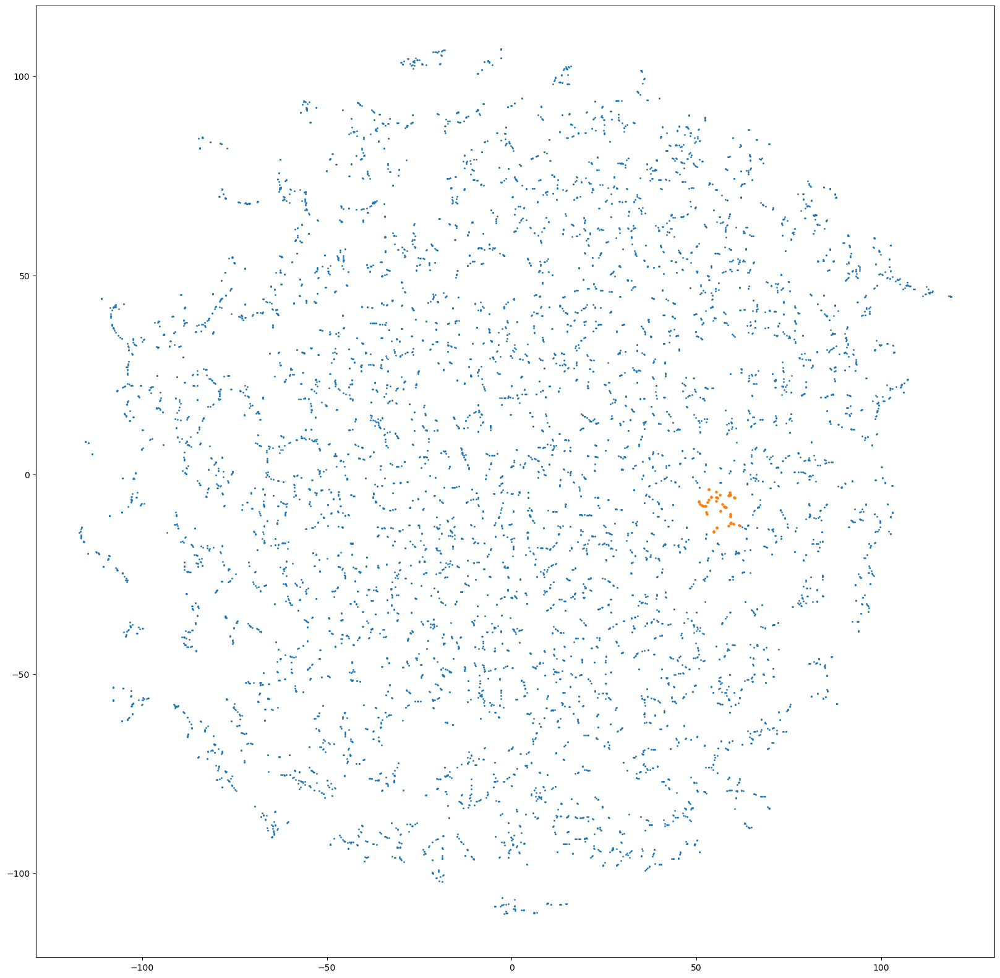

In [8]:
number_of_samples=50
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot()
ax.scatter(data['x'],data['y'],s=1)
ax.scatter(data['x'][0:number_of_samples],data['y'][0:number_of_samples],s=5)

fig.set_size_inches(20, 20)

Picoides tridactylus_Eurasian Three-toed Woodpecker
woodpecker_dataset


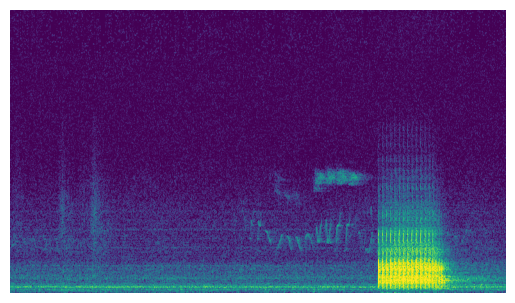

Picoides tridactylus_Eurasian Three-toed Woodpecker
woodpecker_dataset


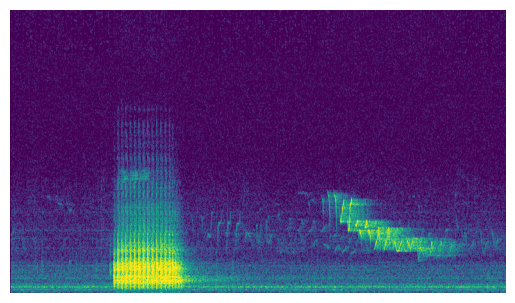

Picoides tridactylus_Eurasian Three-toed Woodpecker
woodpecker_dataset


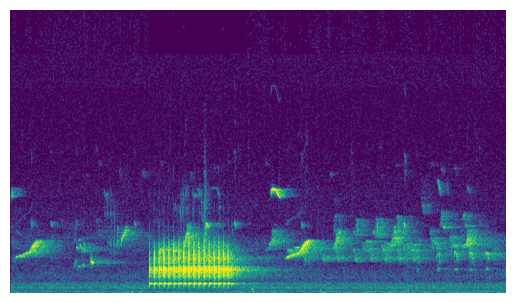

Picoides tridactylus_Eurasian Three-toed Woodpecker
woodpecker_dataset


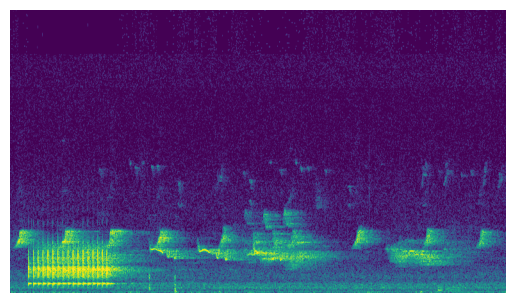

Picoides tridactylus_Eurasian Three-toed Woodpecker
woodpecker_dataset


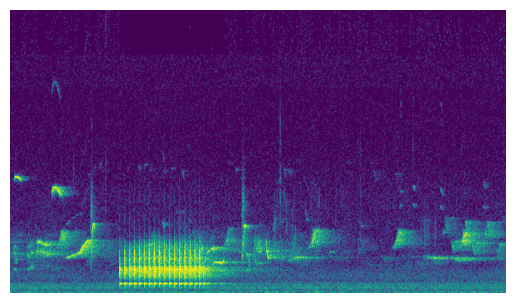

Picoides tridactylus_Eurasian Three-toed Woodpecker
woodpecker_dataset


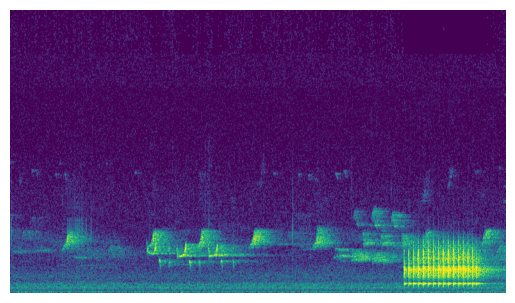

Picoides tridactylus_Eurasian Three-toed Woodpecker
woodpecker_dataset


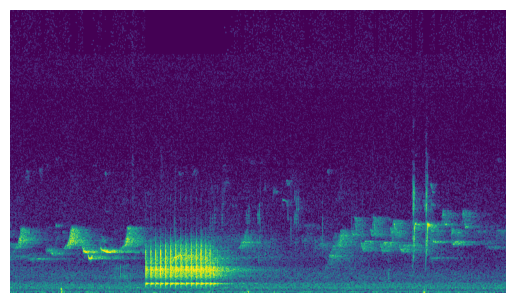

Dendrocopos major_Great Spotted Woodpecker
woodpecker_dataset


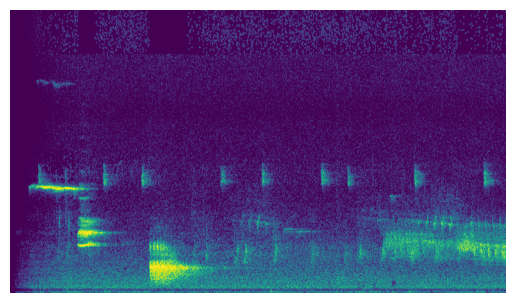

Dryocopus martius_Black Woodpecker
woodpecker_dataset


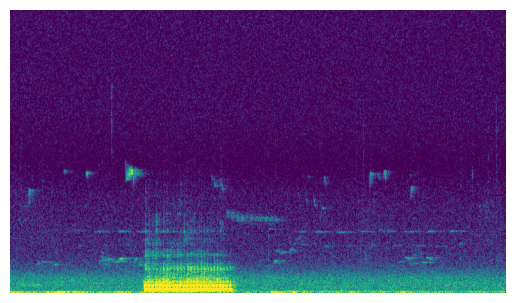

Polioptila caerulea_Blue-grey Gnatcatcher
morton_dataset


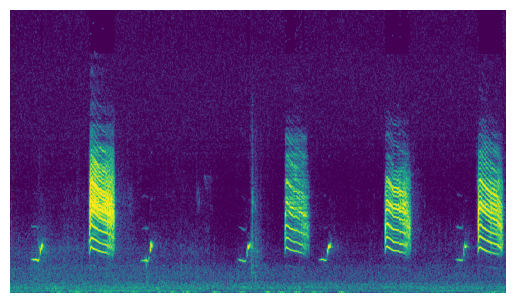

Poecile atricapillus_Black-capped Chickadee
morton_dataset


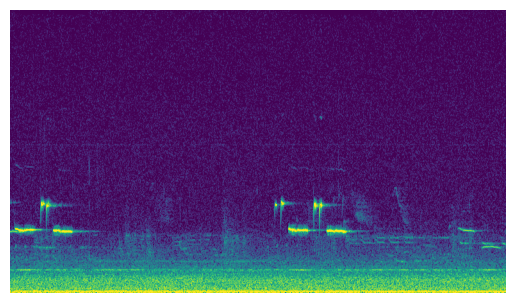

Poecile atricapillus_Black-capped Chickadee
morton_dataset


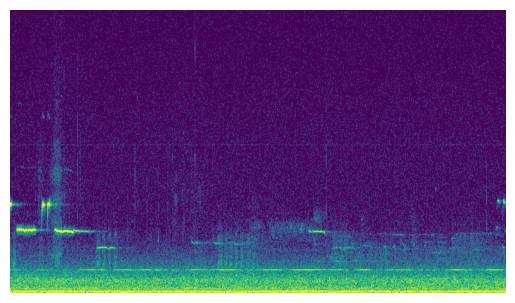

Vireo olivaceus_Red-eyed Vireo
morton_dataset


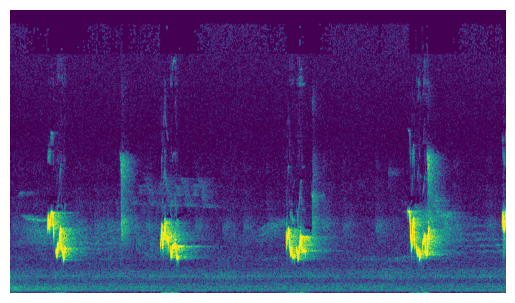

Vireo olivaceus_Red-eyed Vireo
morton_dataset


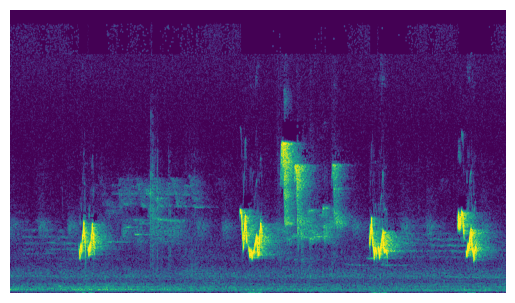

Dryocopus martius_Black Woodpecker
woodpecker_dataset


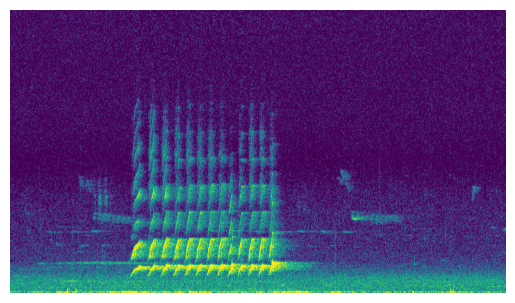

Vireo olivaceus_Red-eyed Vireo
morton_dataset


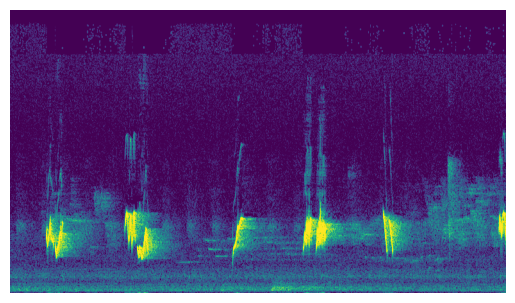

Dryocopus martius_Black Woodpecker
woodpecker_dataset


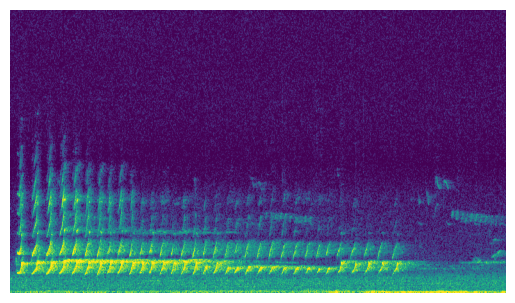

Poecile atricapillus_Black-capped Chickadee
morton_dataset


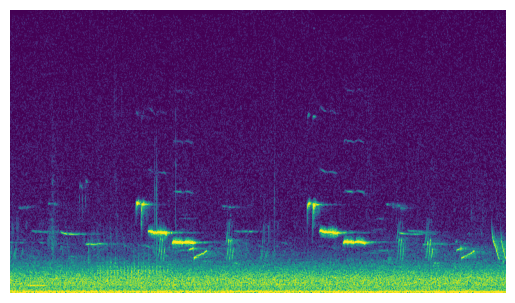

Dendrocopos major_Great Spotted Woodpecker
woodpecker_dataset


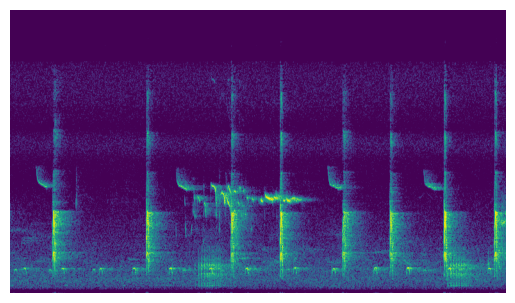

Vireo olivaceus_Red-eyed Vireo
morton_dataset


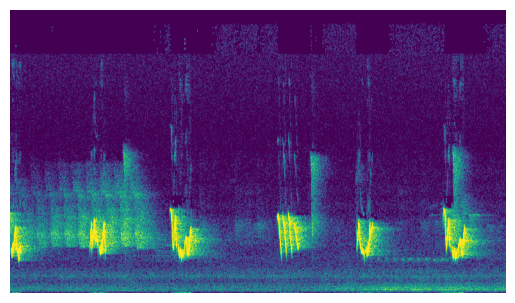

Poecile atricapillus_Black-capped Chickadee
morton_dataset


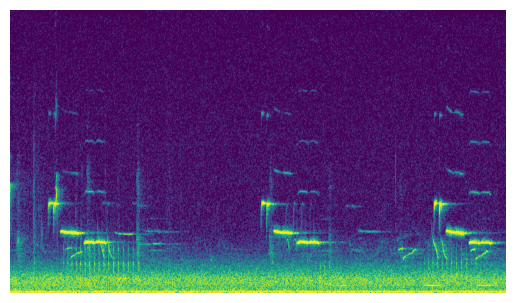

Poecile atricapillus_Black-capped Chickadee
morton_dataset


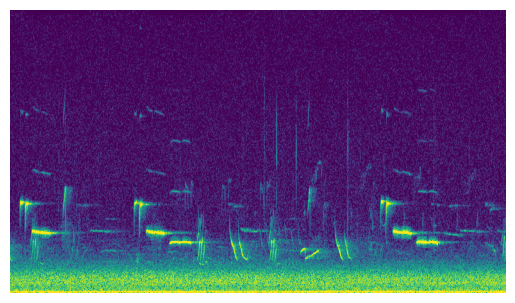

Poecile atricapillus_Black-capped Chickadee
morton_dataset


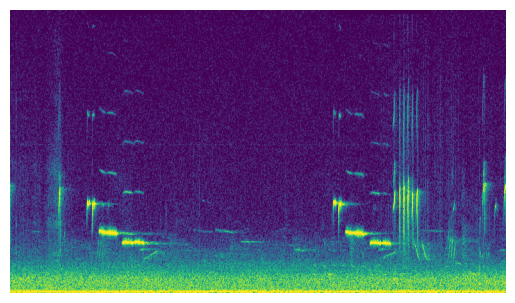

Dryocopus martius_Black Woodpecker
woodpecker_dataset


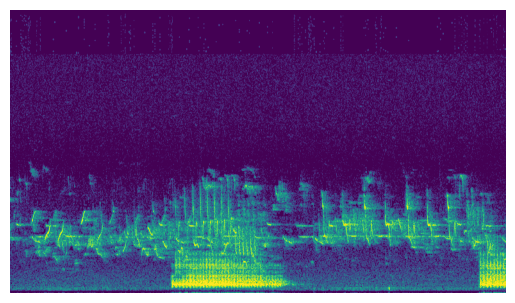

Tachycineta bicolor_Tree Swallow
morton_dataset


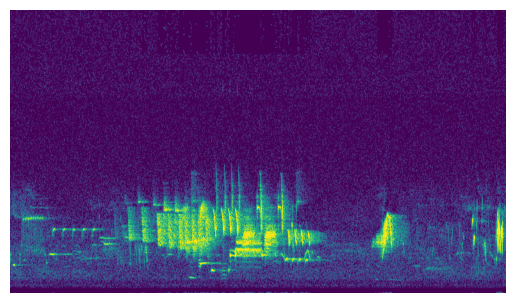

Colaptes auratus_Northern Flicker
morton_dataset


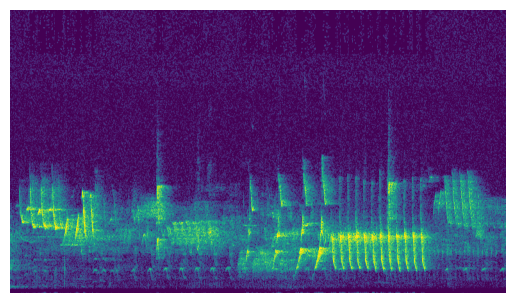

Contopus virens_Eastern Wood Pewee
morton_dataset


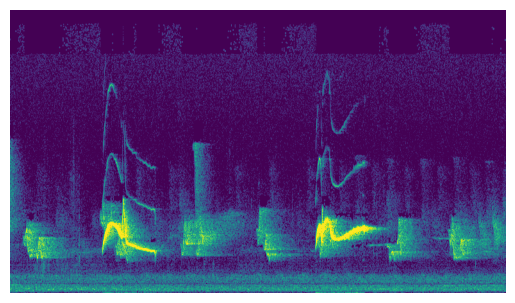

Tachycineta bicolor_Tree Swallow
morton_dataset


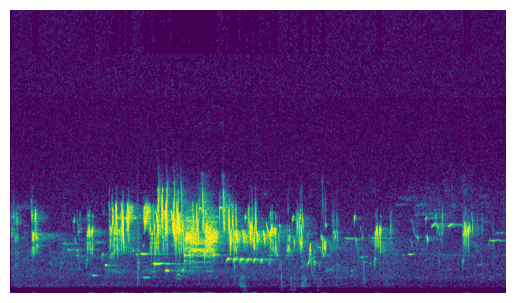

Hirundo rustica_Barn Swallow
morton_dataset


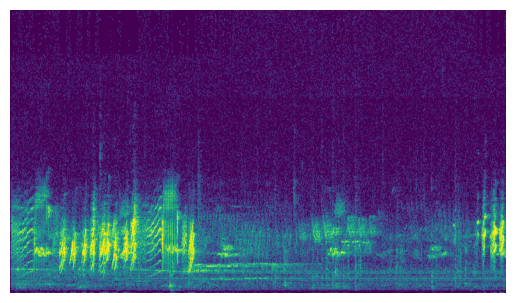

Contopus virens_Eastern Wood Pewee
morton_dataset


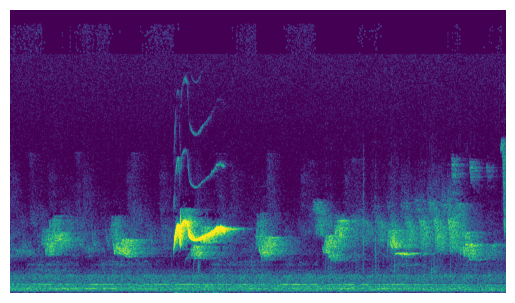

Hylocichla mustelina_Wood Thrush
morton_dataset


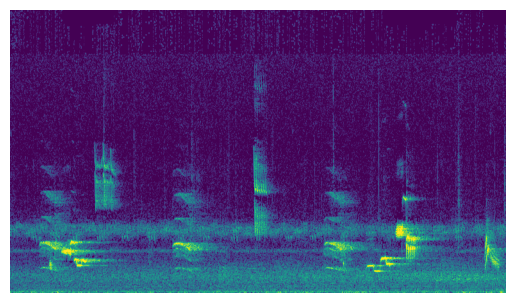

Hylocichla mustelina_Wood Thrush
morton_dataset


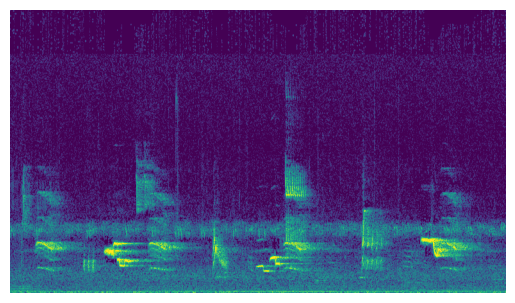

Dendrocopos major_Great Spotted Woodpecker
woodpecker_dataset


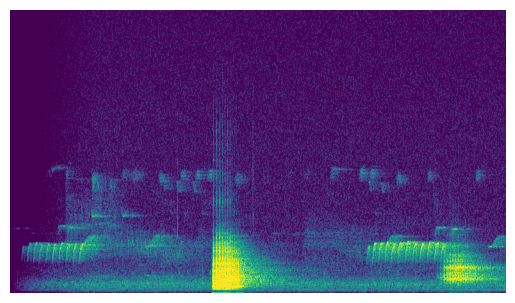

Hylocichla mustelina_Wood Thrush
morton_dataset


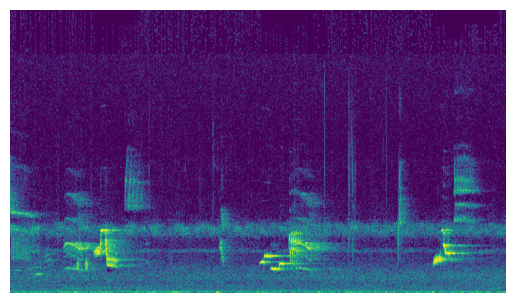

Hylocichla mustelina_Wood Thrush
morton_dataset


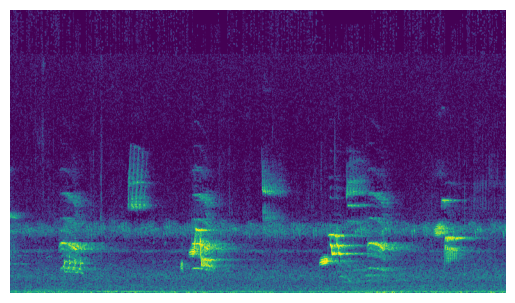

Colaptes auratus_Northern Flicker
morton_dataset


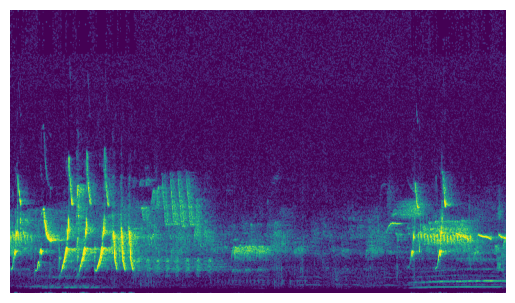

Hylocichla mustelina_Wood Thrush
morton_dataset


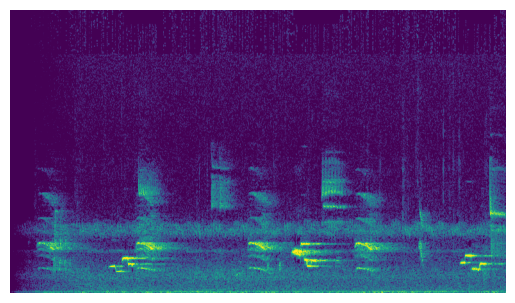

Dendrocopos major_Great Spotted Woodpecker
woodpecker_dataset


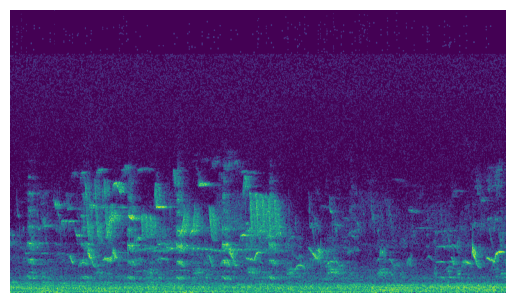

Dendrocopos major_Great Spotted Woodpecker
woodpecker_dataset


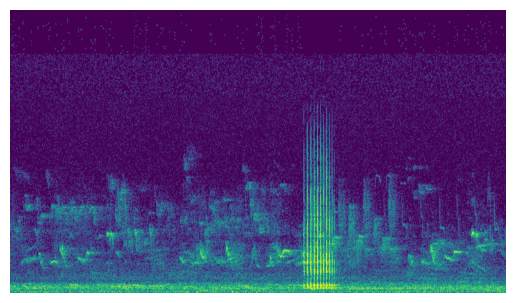

Melospiza melodia_Song Sparrow
morton_dataset


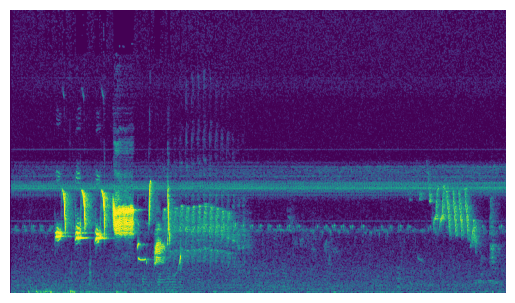

Colaptes auratus_Northern Flicker
morton_dataset


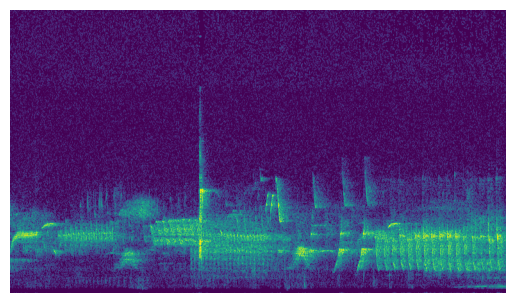

Vireo olivaceus_Red-eyed Vireo
morton_dataset


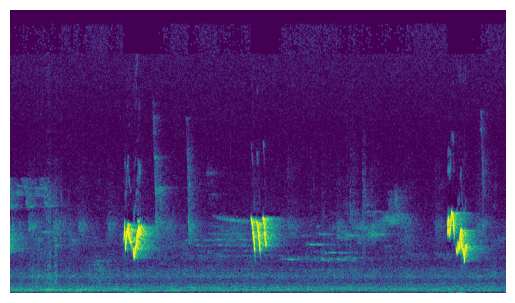

Melospiza melodia_Song Sparrow
morton_dataset


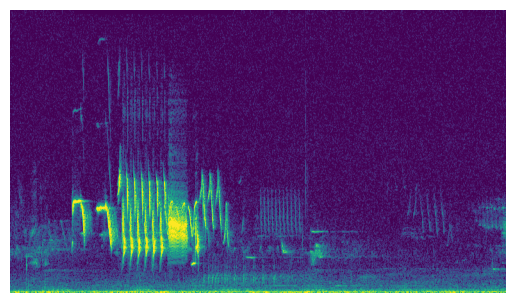

Melospiza melodia_Song Sparrow
morton_dataset


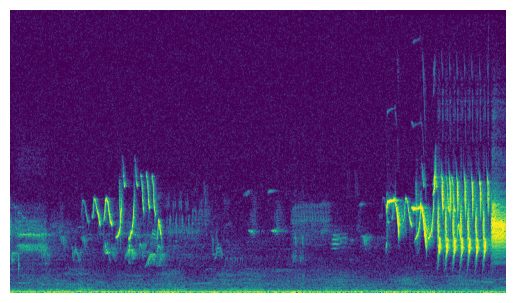

Turdus migratorius_American Robin
morton_dataset


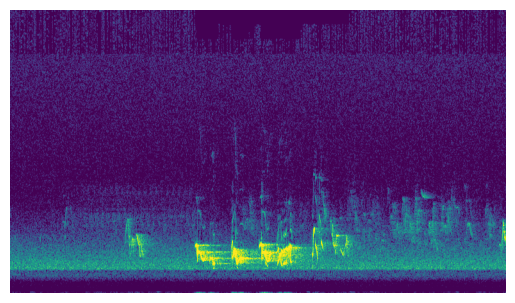

Icterus galbula_Baltimore Oriole
morton_dataset


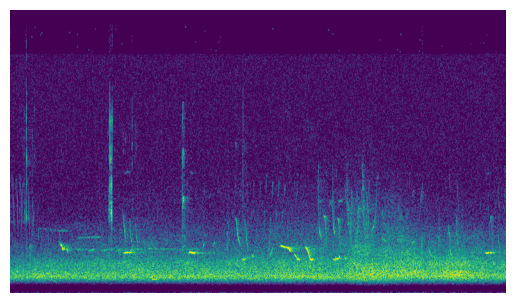

Turdus migratorius_American Robin
morton_dataset


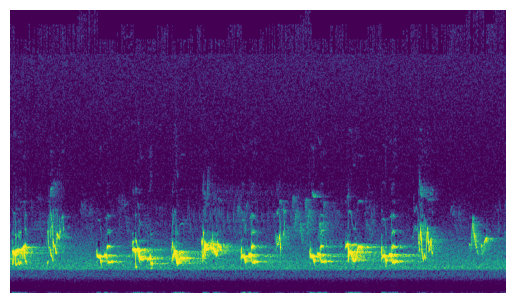

Turdus migratorius_American Robin
morton_dataset


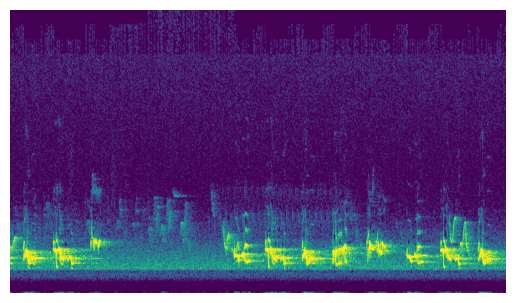

Poecile atricapillus_Black-capped Chickadee
morton_dataset


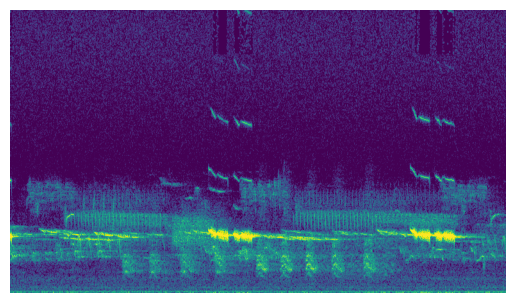

Poecile atricapillus_Black-capped Chickadee
morton_dataset


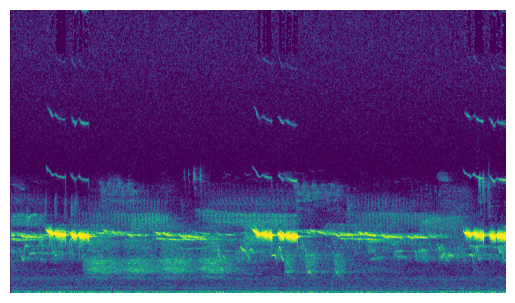

Poecile atricapillus_Black-capped Chickadee
morton_dataset


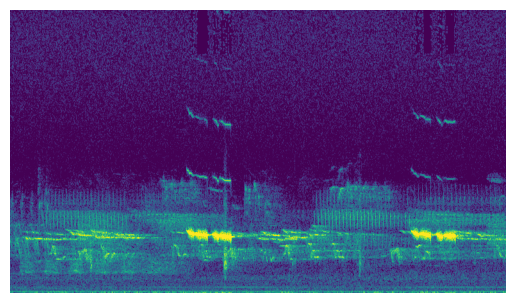

In [9]:
samples=[]
Spectrograms_BASE_PATH = '/grand/projects/BirdAudio/Soundscapes/Xeno_Canto_Spectrograms/'
for k, row in enumerate(data.iterrows()):
    if k > number_of_samples:
        break
        
    file_path = row[1]['paths'][19:]
    print(row[1]['bird_class'])
    print(row[1]['dataset'])
    img = Image.open(os.path.join(Spectrograms_BASE_PATH, file_path))
    imgplot = plt.imshow(img)
    plt.axis('off')
    plt.show()
    samples.append(row[1])

In [10]:
samples = pd.DataFrame(data=samples)
samples

,x,y,labels,paths,dataset,bird_class,bird_label,dataset_label,dist
1338,56.564713,-9.168767,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,0.000000
8833,56.479206,-9.198169,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,0.090420
1383,57.550533,-8.067767,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,1.477851
2527,57.595726,-8.069563,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,1.507063
1101,57.797867,-8.152214,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,1.598139
6027,57.932369,-8.270089,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,1.636492
72,58.030712,-8.233150,4,Spectrogram_Images/woodpecker_dataset/Picoides...,woodpecker_dataset,Picoides tridactylus_Eurasian Three-toed Woodp...,30,1,1.739118
2719,57.064381,-7.366662,4,Spectrogram_Images/woodpecker_dataset/Dendroco...,woodpecker_dataset,Dendrocopos major_Great Spotted Woodpecker,9,1,1.870094
1144,59.144890,-9.979612,4,Spectrogram_Images/woodpecker_dataset/Dryocopu...,woodpecker_dataset,Dryocopus martius_Black Woodpecker,14,1,2.704586
3440,55.366348,-6.703851,4,Spectrogram_Images/morton_dataset/Polioptila c...,morton_dataset,Polioptila caerulea_Blue-grey Gnatcatcher,37,0,2.740783


<AxesSubplot: >

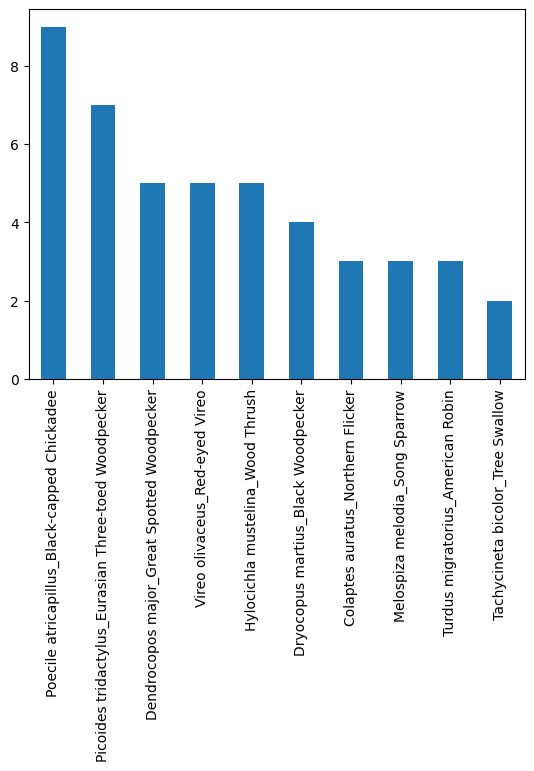

In [11]:
samples.bird_class.value_counts()[0:10].plot.bar()